# Pore scan data analysis

In [1]:
import pandas as pd
import seaborn as sns

In [2]:
# Set the figure size
sns.set_context("notebook", rc={"figure.figsize": (20, 10)})

In [3]:
avn = pd.read_csv('/opt/data/pore_scan/pore_scan_data_AVN323_029d6725_8e1500a2.csv')
avn['group'] = avn.index // 126
avn['run'] = '10.0'
avm = pd.read_csv('/opt/data/pore_scan/pore_scan_data_AVM281_df682c33_49d6f77e.csv')
avm['group'] = avm.index // 126
avm['run'] = '02.5'
avy = pd.read_csv('/opt/data/pore_scan/pore_scan_data_AVY051_d1a579dc_dcf30013.csv')
avy['group'] = avy.index // 126
avy['run'] = '00.0'
df = pd.concat([avn, avm, avy])
df

,channel,well,adapter,collinear_confidence,conductance,conductance_filtered_data,event,experiment_tag,flow_cell_id,group_1_adjusted_offset_0mv_pa,...,total_good_samples,total_time_active,transition,unavailable,unclassed,unknown_negative,unknown_positive,zero,group,run
0,1,1,0,NaN,NaN,False,0,LMD,AVN323,NaN,...,0,0.000,0,0,0,0,0,0,0,10.0
1,2,1,0,NaN,NaN,False,0,LMD,AVN323,NaN,...,0,0.000,0,0,0,0,0,0,0,10.0
2,3,1,0,-5.90,0.647,True,0,LMD,AVN323,1.113,...,0,0.000,0,47063,0,0,15,0,0,10.0
3,4,1,0,NaN,NaN,False,0,LMD,AVN323,NaN,...,0,0.000,0,0,0,0,0,0,0,10.0
4,5,1,0,NaN,NaN,False,0,LMD,AVN323,NaN,...,0,0.000,0,0,0,0,0,0,0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,122,1,0,-0.12,0.057,False,0,LMD,AVY051,-0.425,...,0,2021.187,0,47347,0,0,14,0,15,00.0
2012,123,1,0,-0.68,0.049,False,0,LMD,AVY051,-1.528,...,0,2021.187,0,0,0,0,26,55148,15,00.0
2013,124,1,0,-0.62,0.049,False,0,LMD,AVY051,-0.694,...,0,2021.187,0,0,0,0,15,55141,15,00.0
2014,125,1,0,0.86,0.069,False,0,LMD,AVY051,-1.451,...,0,2021.187,0,42397,0,0,5010,0,15,00.0


In [4]:
def compare_plot(df, col, run1='10.0', run2='02.5', run3='00.0'):
    df1 = df[df['run'] == run1][['run', 'group', col]].copy()
    df1 = df1.sort_values(['group', col], ascending=[True, False]).reset_index(drop=True)
    df1['key'] = df1.index
    df1['value'] = df1[col]
    
    df2 = df[df['run'] == run2][['run', 'group', col]].copy()
    df2 = df2.sort_values(['group', col], ascending=[True, False]).reset_index(drop=True)
    df2['key'] = df2.index
    df2['value'] = df2[col]
    
    df3 = df[df['run'] == run3][['run', 'group', col]].copy()
    df3 = df3.sort_values(['group', col], ascending=[True, False]).reset_index(drop=True)
    df3['key'] = df3.index
    df3['value'] = df3[col]
    
    d = pd.concat([df1, df2, df3])[['run', 'group', 'key', 'value']].reset_index(drop=True)
    g = sns.FacetGrid(d, col="group", col_wrap=4, height=4, sharex=False, sharey=True)
    g.map(sns.lineplot, "key", "value", "run", marker='o', hue_order=['10.0', '02.5', '00.0'])
    g.add_legend(title=col, bbox_to_anchor=(1.05, 0.5), loc='center left')
    g.savefig(f'/opt/data_out/porescan/{col}.png')

/usr/local/lib/python3.8/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


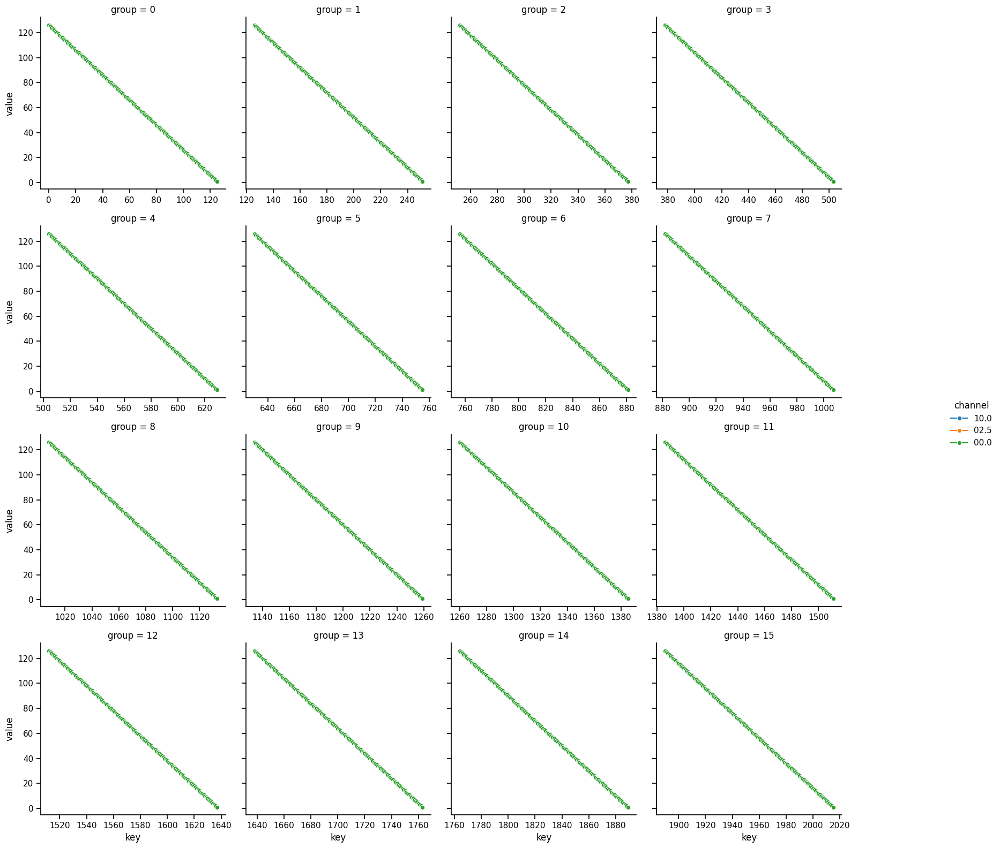

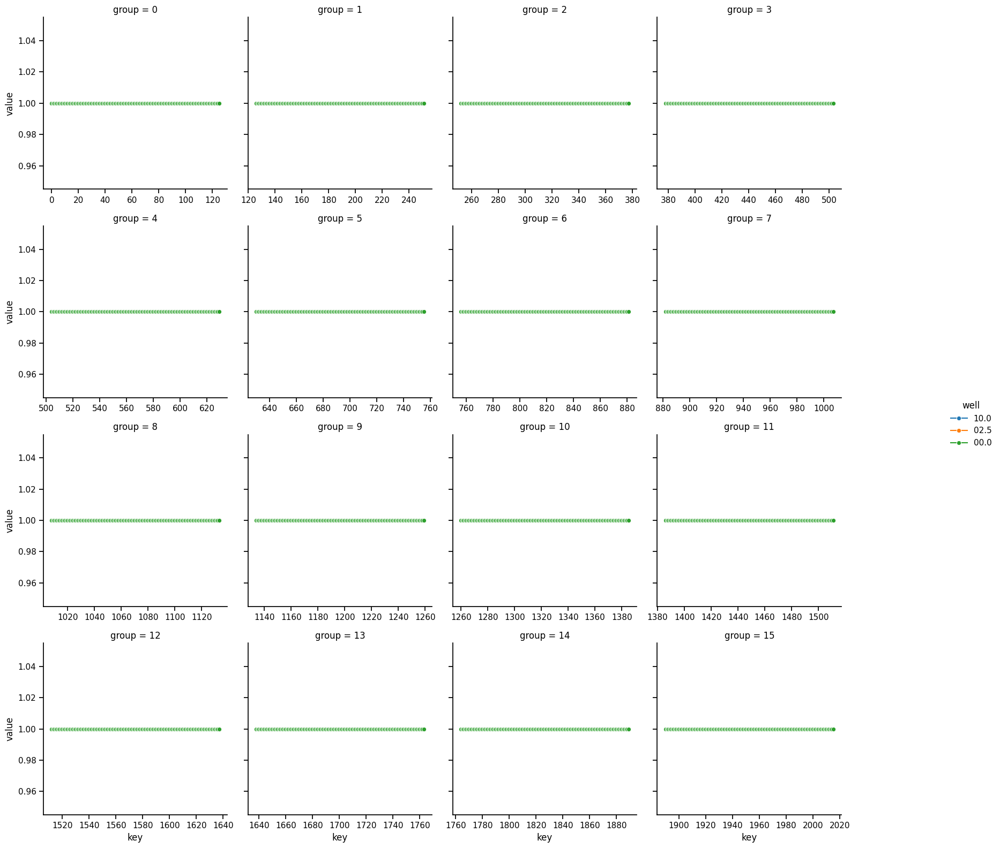

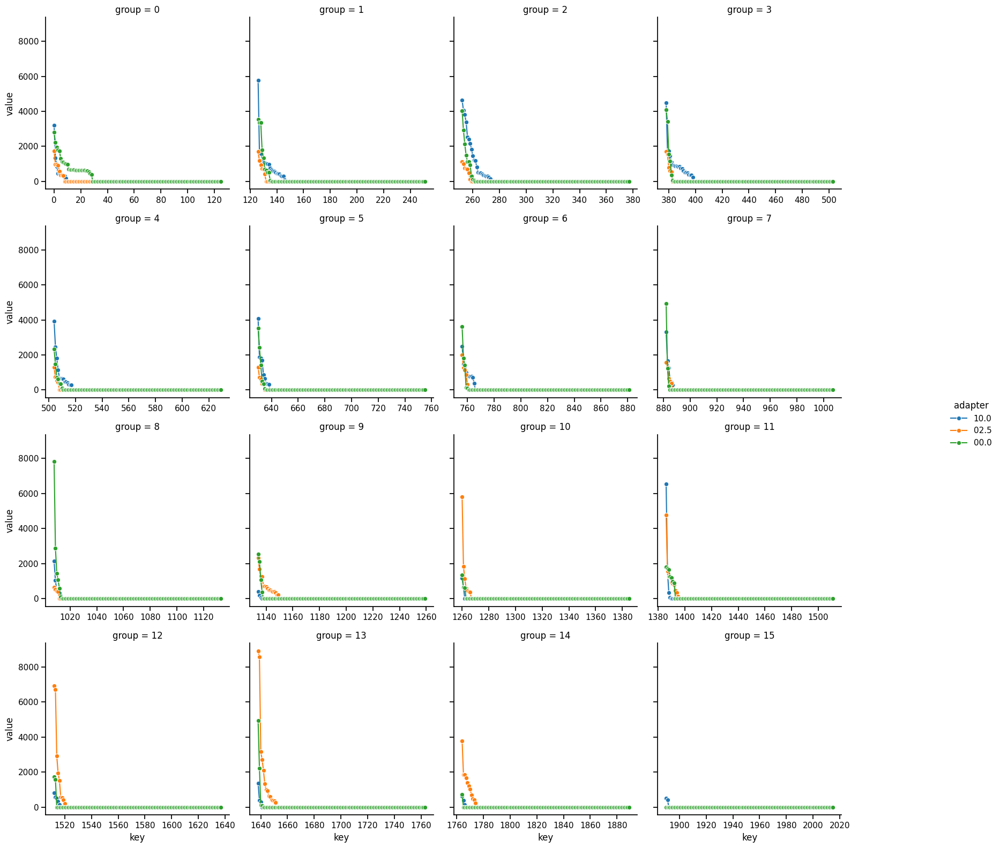

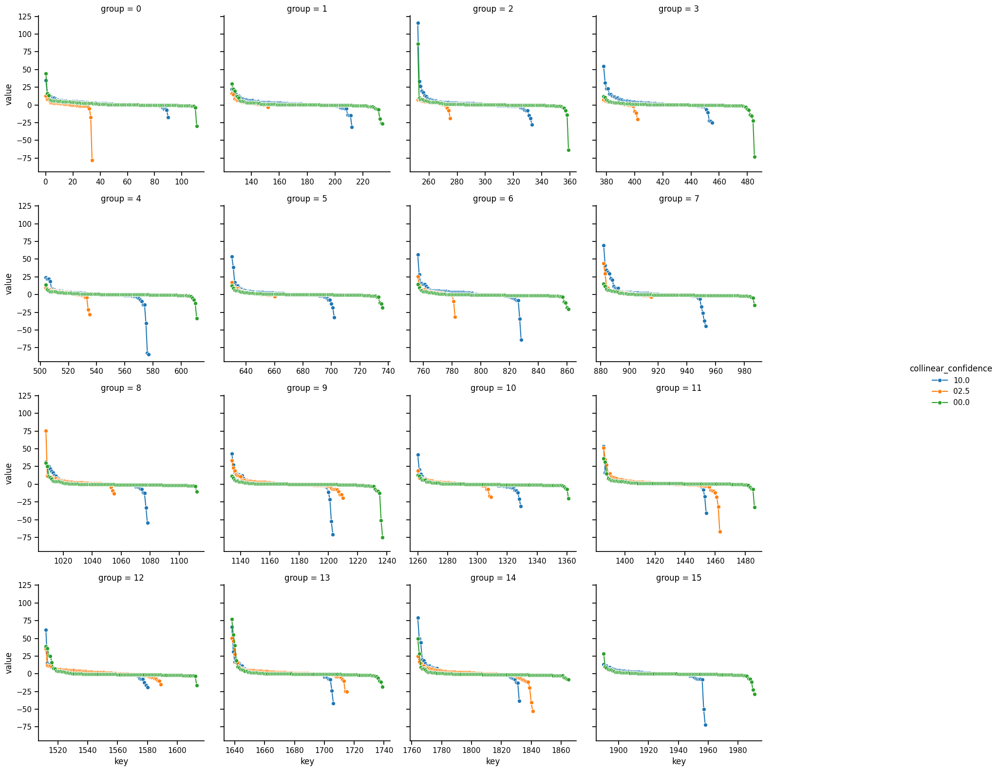

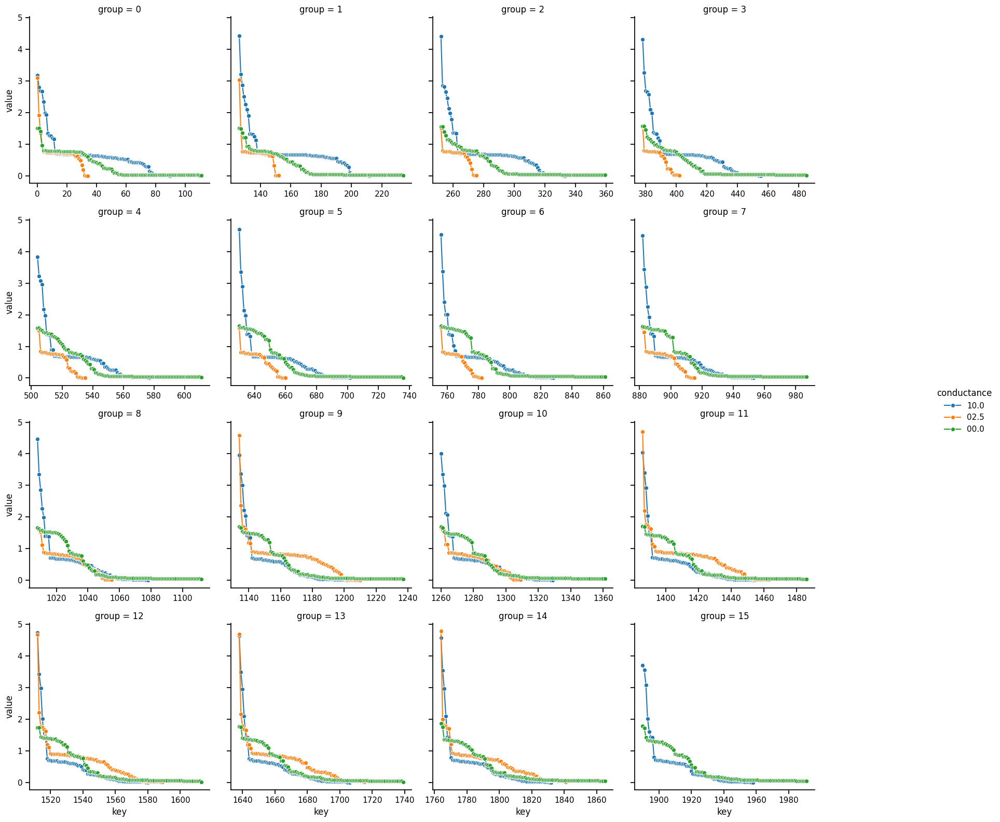

...

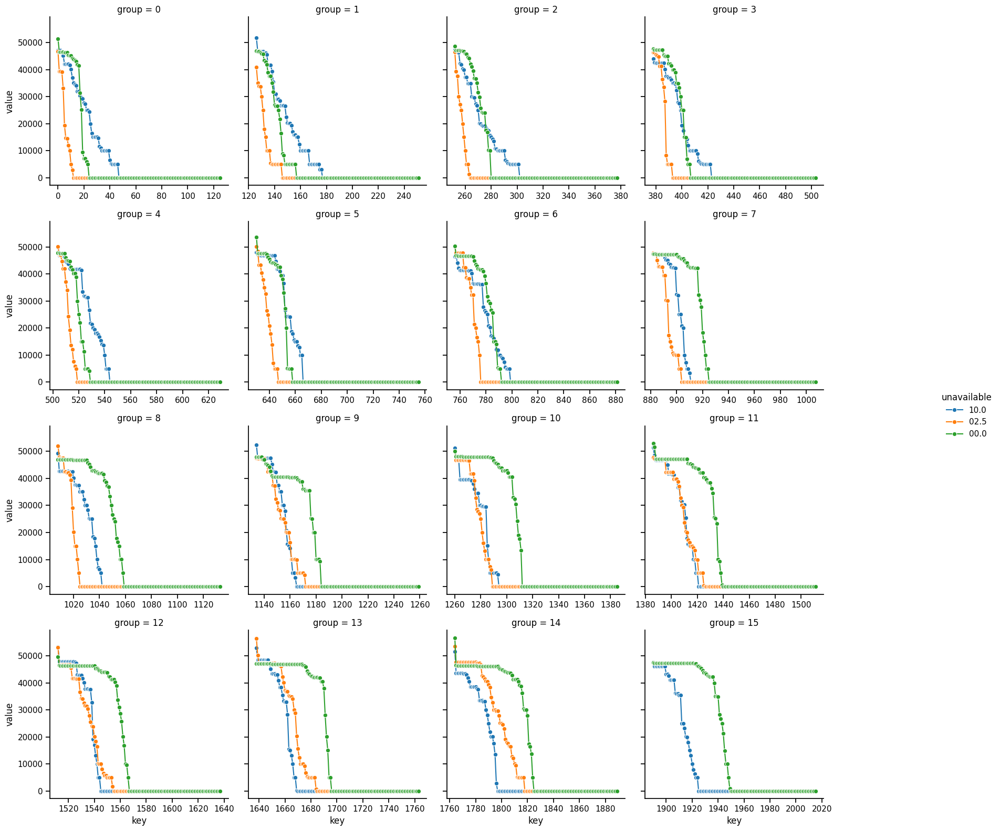

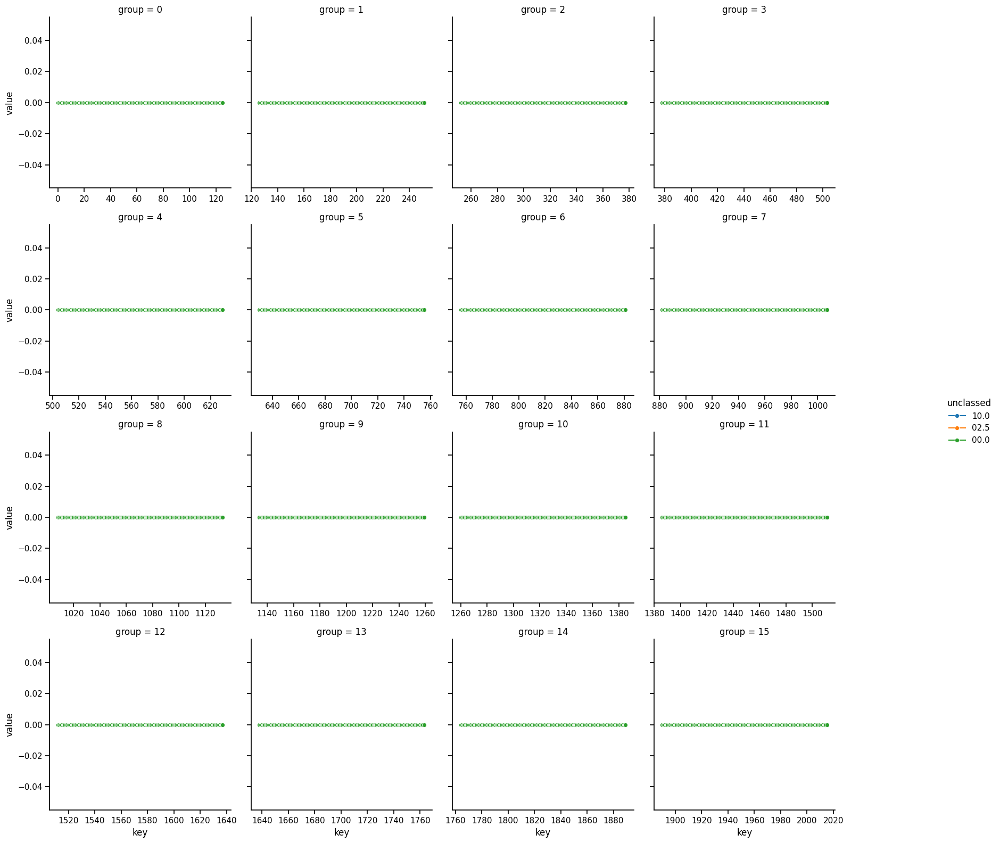

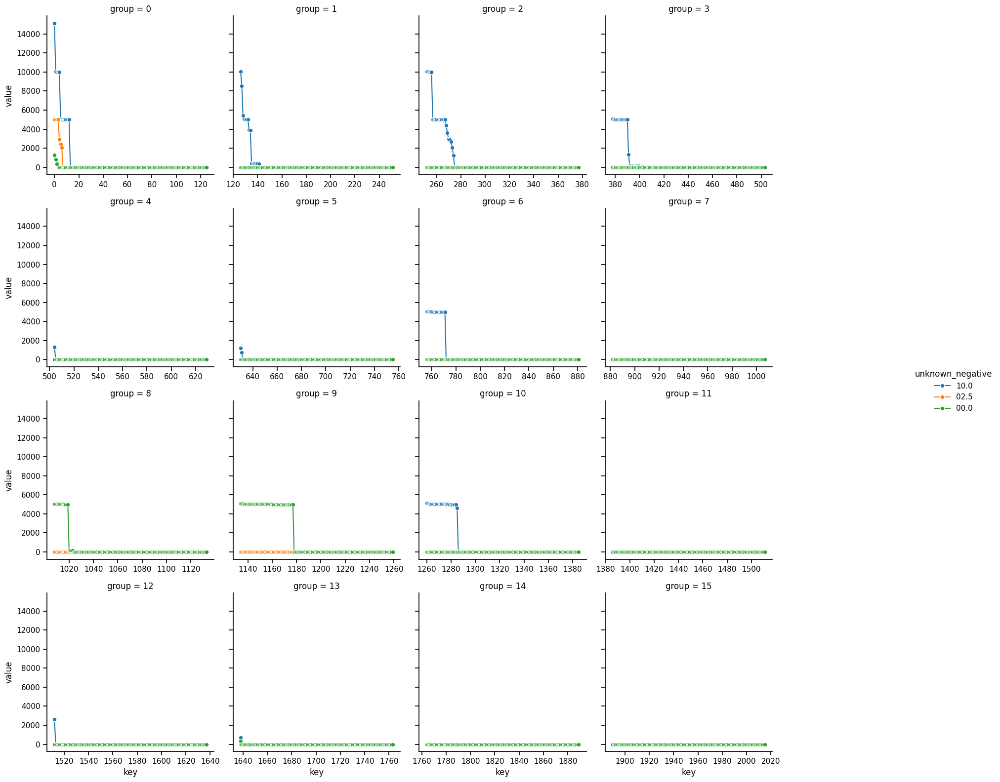

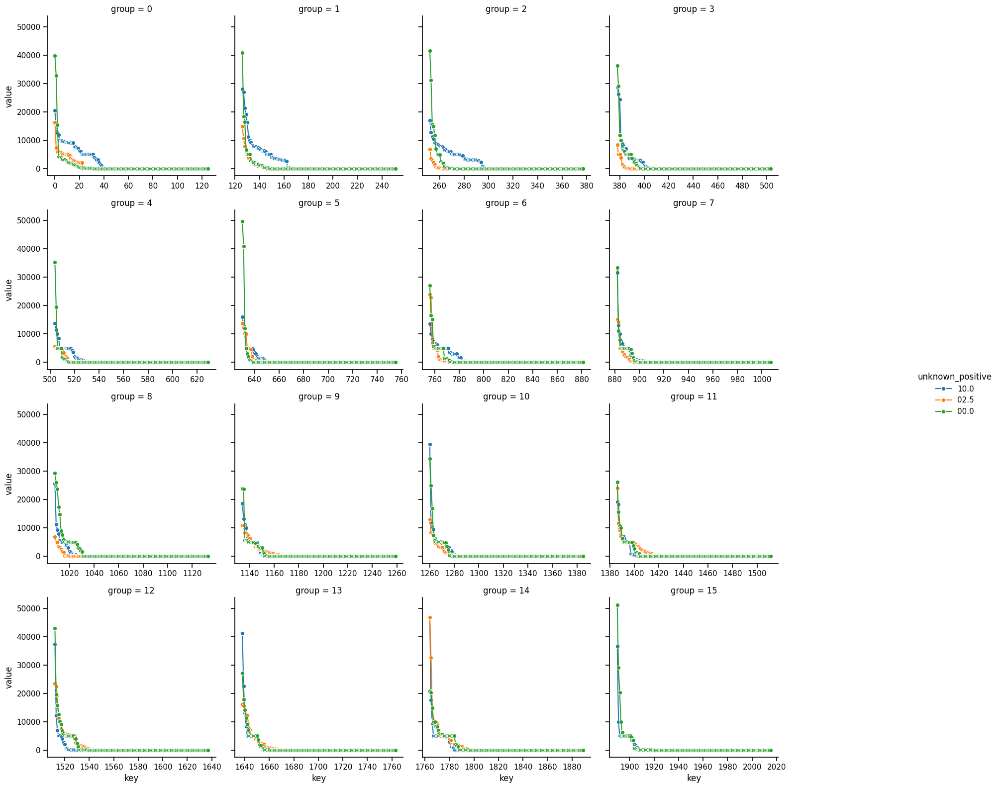

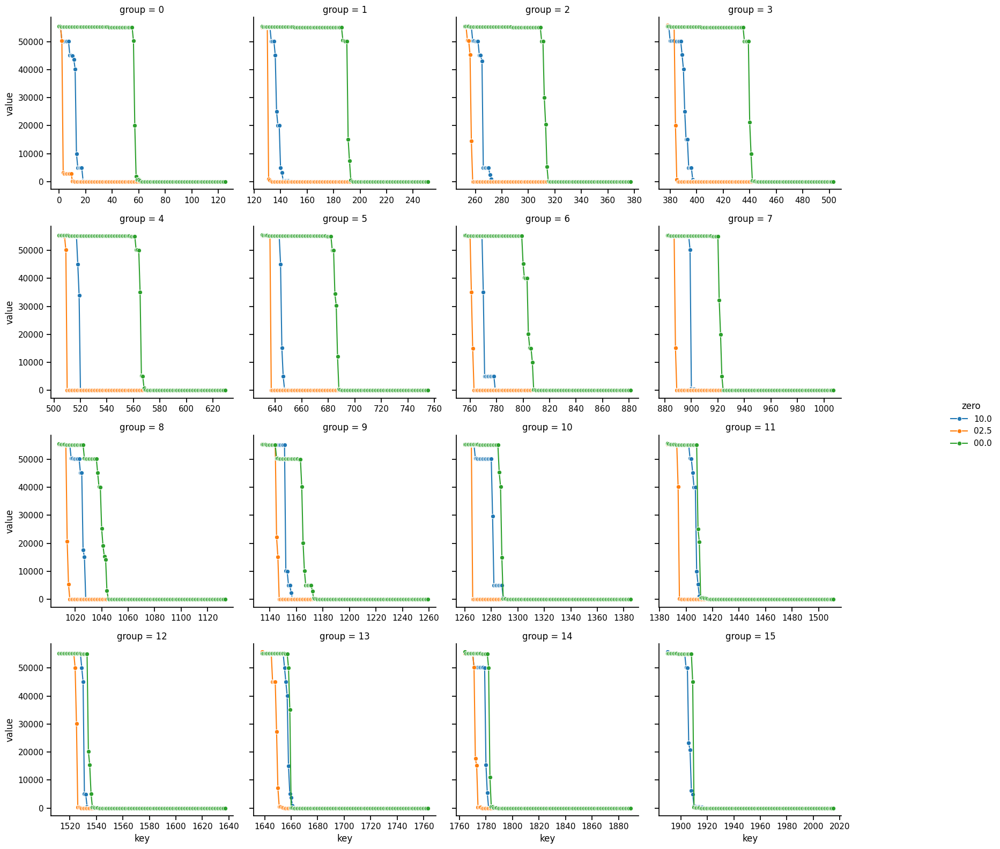

In [5]:
cols = [col for col in df.select_dtypes(include=['int', 'float']).columns.tolist() if col not in ['run', 'group']]
for col in cols:
    compare_plot(df, col)